# The Environmental Context of Fire Severity: Global Patterns and Insights

Data Question: What patterns in historical fire activity, weather, and vegetation data are most predictive of potential wildfire severity?

This project investigates whether it is possible to predict wildfire severity at the time of ignition using information about recent fire activity, seasonal timing, environmental variables, and geographic context.

By understanding which factors most strongly influence fire severity, the model can help guide fire management strategies, preparedness planning, and prevention efforts.

Data Source: Pan, T. (2025). Global wildfire exposure dataset (1.0.0) [Data set]. Zenodo. https://doi.org/10.5281/zenodo.15254187

In [ ]:
#imports

import pandas as pd
import xarray as xr
from google.colab import drive
drive.mount('/content/drive')

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium


Mounted at /content/drive


### Load and Join Data

In [ ]:
#load first dataset
fires = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/fire_clusters.csv')
fires.head()

,cp,duration,maxFRP_sum,area,country,continent,dtime_min,lat_mean,lon_mean,population,5km_pop,year,month
0,9619,3,320184,225.820924,Australia,Oceania,2002-01-01,-33.290782,150.641158,127,491,2002,1
1,17668,4,826221,151.119706,Australia,Oceania,2002-01-01,-34.344506,150.645789,490,8546,2002,1
2,24182,5,160562,111.622510,Australia,Oceania,2002-01-01,-33.764317,150.487546,811,52971,2002,1
3,25916,3,248907,151.119706,Australia,Oceania,2002-01-01,-32.726481,150.904068,25,126,2002,1
4,26438,9,222731,48.083543,United States of America,North America,2002-01-01,19.347472,-155.066124,109,309,2002,1


- duration (days)
- maxFRP_sum - sum of maximum radiative power of each fire (heat intensity)
- area (km^2)
- population - primary pop within the fire cluster
- 5km_pop - secondary pop exposed to the fire

In [ ]:
fires.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1821713 entries, 0 to 1821712
Data columns (total 13 columns):
 #   Column      Dtype  
---  ------      -----  
 0   cp          int64  
 1   duration    int64  
 2   maxFRP_sum  int64  
 3   area        float64
 4   country     object 
 5   continent   object 
 6   dtime_min   object 
 7   lat_mean    float64
 8   lon_mean    float64
 9   population  int64  
 10  5km_pop     int64  
 11  year        int64  
 12  month       int64  
dtypes: float64(3), int64(7), object(3)
memory usage: 180.7+ MB


In [ ]:
#drop columns
fires = fires.drop(columns = ['cp', 'population', '5km_pop'])

- Dropping cp column. cp is defined as a fire component variable. It doesn't seem to contain meaningful information for prediction. It looks more like an internal label or ID rather than a real fire feature.
- population and 5km_pop are not predictive for this particular analysis

In [ ]:
#checking for nulls
fires.isnull().sum()

,0
duration,0
maxFRP_sum,0
area,0
country,0
continent,0
dtime_min,0
lat_mean,0
lon_mean,0
year,0
month,0


In [ ]:
#load second dataset
exposure = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/exposure_covariate.csv')
display(exposure.head())

,population,year,country,continent,gdp,country_pop,fwi,vpd,ndvi,dnbr,iso3,cluster
0,2970,2002,Afghanistan,Asia,3.825701e+09,21000256,29.748024,2.525337,0.388200,-0.077150,AFG,2
1,327563,2002,Algeria,Africa,6.151610e+10,31624696,50.114716,3.775391,0.192501,0.022259,DZA,2
2,991550,2002,Angola,Africa,1.528559e+10,17516139,46.849110,3.415407,0.387614,0.043421,AGO,2
3,186969,2002,Argentina,South America,9.772400e+10,37885028,28.716340,3.073630,0.369001,0.029879,ARG,2
4,127125,2002,Australia,Oceania,3.957887e+11,19495210,60.910130,4.432191,0.274552,0.049212,AUS,2


- fwi - fire weather index
    - potential intensity and ease of ignition
    - derived from temp, humidity, wind, percipitation
    - high # = fast spreading fire with large areas burned
    - 0-100 range
- vpd - vapor pressure deficit
    - dryness of the air
    - high # = dry air, pulls water out of vegetation, making plants dry as well
    - 0-10 range
- ndvi - normalized difference vegetation index
    - measures health of vegetation based on satellite imagery
    - low = dry/spare veg (less fuel)
    - high = more/lush veg (more fuel)
    - 0-1 range
- dnbr - delta normalized burn ratio (don't use in model)
    - how bad was the fire based on vegetation damage before and after
    - greater than 0.6 is severe, .1-.3 moderate, less than 0 no burn / regrowth
    - -2-2 range

In [ ]:
exposure.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2803 entries, 0 to 2802
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   population   2803 non-null   int64  
 1   year         2803 non-null   int64  
 2   country      2803 non-null   object 
 3   continent    2803 non-null   object 
 4   gdp          2803 non-null   float64
 5   country_pop  2803 non-null   int64  
 6   fwi          2803 non-null   float64
 7   vpd          2803 non-null   float64
 8   ndvi         2803 non-null   float64
 9   dnbr         2802 non-null   float64
 10  iso3         2803 non-null   object 
 11  cluster      2803 non-null   int64  
dtypes: float64(5), int64(4), object(3)
memory usage: 262.9+ KB


In [ ]:
#checking for gaps in data
exposure['year'].value_counts()

,count
year,
2003,154
2006,154
2007,151
2011,151
2015,151
2013,150
2004,149
2010,149
2019,147


In [ ]:
exposure['country'].value_counts()

,count
country,
Algeria,19
Angola,19
Argentina,19
Australia,19
Burundi,19
...,...
Barbados,1
Baikonur,1
Iceland,1


some countries appear more depending on how frequntly they experienced fires and how well data was collected

In [ ]:
#drop columns from exposure
exposure = exposure.drop(columns = ['cluster', 'country_pop', 'continent', 'iso3'])

- Dropping cluster since it is an interal label dervied from K means clustering on an analysis not relevant to this project
- country_pop is not relevant to this particular analysis
- continent is redundant with the fires dataset
- iso3 is redundant with country
- keeping population exposed and gdp information for now for analysis insights

In [ ]:
#checking that country and year are suitable join keys
exposure[['country', 'year']].duplicated().sum()

np.int64(0)

In [ ]:
#do country names match in both datasets?
fire_countries = set(fires['country'].unique())
exposure_countries = set(exposure['country'].unique())

In [ ]:
#countries in fire data but missing in exposure data
fire_not_in_exposure = fire_countries - exposure_countries

#countries in exposure data but not in fire data
exposure_not_in_fire = exposure_countries - fire_countries

In [ ]:
print("Countries in fires but not in exposure:", fire_not_in_exposure)
print("Countries in exposure but not in fires:", exposure_not_in_fire)
print("Number unmatched from fires:", len(fire_not_in_exposure))
print("Number unmatched from exposure:", len(exposure_not_in_fire))

Countries in fires but not in exposure: {'North Korea', 'Trinidad and Tobago', 'São Tomé and Príncipe', 'eSwatini', 'Democratic Republic of the Congo', 'Republic of the Congo', 'United Nations Buffer Zone in Cyprus', 'Republic of Macedonia', 'United States of America', "People's Republic of China", 'Bosnia and Herzegovina', 'Turkish Republic of Northern Cyprus'}
Countries in exposure but not in fires: {'Democratic Republic Of The Congo', 'Eswatini', 'Republic Of The Congo', 'Trinidad And Tobago', "People'S Republic Of China", 'Turkish Republic Of Northern Cyprus', 'United Nations Buffer Zone In Cyprus', 'Bosnia And Herzegovina', 'Republic Of Macedonia', 'São Tomé And Príncipe', 'United States Of America'}
Number unmatched from fires: 12
Number unmatched from exposure: 11


In [ ]:
#standardize country names before merging
fires['country'] = fires['country'].str.strip().str.lower()
exposure['country'] = exposure['country'].str.strip().str.lower()

In [ ]:
#merge data
df = fires.merge(exposure, on=['country', 'year'], how='left')
df.head()

,duration,maxFRP_sum,area,country,continent,dtime_min,lat_mean,lon_mean,year,month,population,gdp,fwi,vpd,ndvi,dnbr
0,3,320184,225.820924,australia,Oceania,2002-01-01,-33.290782,150.641158,2002,1,127125.0,3.957887e+11,60.910130,4.432191,0.274552,0.049212
1,4,826221,151.119706,australia,Oceania,2002-01-01,-34.344506,150.645789,2002,1,127125.0,3.957887e+11,60.910130,4.432191,0.274552,0.049212
2,5,160562,111.622510,australia,Oceania,2002-01-01,-33.764317,150.487546,2002,1,127125.0,3.957887e+11,60.910130,4.432191,0.274552,0.049212
3,3,248907,151.119706,australia,Oceania,2002-01-01,-32.726481,150.904068,2002,1,127125.0,3.957887e+11,60.910130,4.432191,0.274552,0.049212
4,9,222731,48.083543,united states of america,North America,2002-01-01,19.347472,-155.066124,2002,1,134333.0,1.092911e+13,21.786533,2.435209,0.530305,0.041884


In [ ]:
#checking for remaining nulls
df.isnull().sum()

,0
duration,0
maxFRP_sum,0
area,0
country,0
continent,0
dtime_min,0
lat_mean,0
lon_mean,0
year,0
month,0


In [ ]:
#what proportion of the data matched successfully
matched = df['fwi'].notna().sum()
missing = df['fwi'].isna().sum()

print(f"Matched rows: {matched:,}")
print(f"Missing rows: {missing:,}")
print(f"Match rate: {matched / len(df):.2%}")



Matched rows: 1,756,493
Missing rows: 65,220
Match rate: 96.42%


In [ ]:
#countries missing exposure data
df[df['fwi'].isna()]['country'].value_counts()


,count
country,
south sudan,58867
venezuela,5696
north korea,529
eritrea,80
iceland,13
falkland islands,5
yemen,4
united kingdom,4
armenia,3


In [ ]:
#impute missing exposure variables by country-year averages
for col in ['fwi', 'vpd', 'ndvi']:
    df[col] = df.groupby(['country', 'year'])[col].transform(lambda x: x.fillna(x.mean()))

#if no other entries for that country in that year, impute by continent-year averages
for col in ['fwi', 'vpd', 'ndvi']:
    df[col] = df.groupby(['continent', 'year'])[col].transform(lambda x: x.fillna(x.mean()))

Missing exposure data (3.6% of records) primarily originated from countries with limited climate or socioeconomic coverage (e.g., South Sudan, North Korea, and several small nations which possibly lack satellite image data due to cloud cover or something else). Values for FWI, VPD, and NDVI were imputed using country–year means or continent-year means to maintain dataset completeness. Population, GDP, and dNBR remain null, as these variables are not suitable for simple imputation. Since they will not be included in the modeling stage of this project, it is appropriate to leave them missing for now.

In [ ]:
#all three columns filled
df[['fwi', 'vpd', 'ndvi']].isna().sum()

,0
fwi,0
vpd,0
ndvi,0


In [ ]:
#make dtime_min a datetime obj
df['dtime_min'] = pd.to_datetime(df['dtime_min'])

In [ ]:
df.head()

,duration,maxFRP_sum,area,country,continent,dtime_min,lat_mean,lon_mean,year,month,population,gdp,fwi,vpd,ndvi,dnbr
0,3,320184,225.820924,australia,Oceania,2002-01-01,-33.290782,150.641158,2002,1,127125.0,3.957887e+11,60.910130,4.432191,0.274552,0.049212
1,4,826221,151.119706,australia,Oceania,2002-01-01,-34.344506,150.645789,2002,1,127125.0,3.957887e+11,60.910130,4.432191,0.274552,0.049212
2,5,160562,111.622510,australia,Oceania,2002-01-01,-33.764317,150.487546,2002,1,127125.0,3.957887e+11,60.910130,4.432191,0.274552,0.049212
3,3,248907,151.119706,australia,Oceania,2002-01-01,-32.726481,150.904068,2002,1,127125.0,3.957887e+11,60.910130,4.432191,0.274552,0.049212
4,9,222731,48.083543,united states of america,North America,2002-01-01,19.347472,-155.066124,2002,1,134333.0,1.092911e+13,21.786533,2.435209,0.530305,0.041884


## Exploratory Data Analysis

#### Analysing Severity Features: Area, Duration, FRP

In [ ]:
df.describe()

,duration,maxFRP_sum,area,dtime_min,lat_mean,lon_mean,year,month,population,gdp,fwi,vpd,ndvi,dnbr
count,1.821713e+06,1.821713e+06,1.821713e+06,1821713,1.821713e+06,1.821713e+06,1.821713e+06,1.821713e+06,1.756493e+06,1.756493e+06,1.821713e+06,1.821713e+06,1.821713e+06,1.756492e+06
mean,2.141652e+00,4.293948e+04,2.487912e+01,2011-02-27 08:15:36.764024064,1.714406e+00,1.973780e+01,2.010609e+03,7.108899e+00,1.213042e+06,8.359915e+11,3.948796e+01,3.444088e+00,4.231946e-01,5.532387e-02
min,1.000000e+00,1.027600e+04,8.586347e-01,2002-01-01 00:00:00,-5.461299e+01,-1.797451e+02,2.002000e+03,1.000000e+00,0.000000e+00,2.625965e+08,6.367888e-02,1.213352e-01,-2.880000e-02,-4.417000e-01
25%,1.000000e+00,1.353200e+04,1.287952e+01,2006-07-12 00:00:00,-1.304306e+01,-1.104154e+01,2.006000e+03,5.000000e+00,2.208430e+05,1.532834e+10,3.103075e+01,3.116123e+00,3.756739e-01,2.959669e-02
50%,2.000000e+00,1.950800e+04,1.888996e+01,2010-10-27 00:00:00,-5.994518e+00,2.303802e+01,2.010000e+03,8.000000e+00,8.491580e+05,5.616493e+10,4.035901e+01,3.479070e+00,4.071491e-01,5.289109e-02
75%,2.000000e+00,3.505600e+04,2.661768e+01,2015-09-19 00:00:00,1.017917e+01,3.582839e+01,2.015000e+03,9.000000e+00,1.604834e+06,7.640160e+11,4.948606e+01,3.876816e+00,4.792861e-01,7.514749e-02
max,2.340000e+02,9.170085e+07,9.808184e+03,2020-12-31 00:00:00,7.198841e+01,1.796436e+02,2.020000e+03,1.200000e+01,6.837004e+06,2.152140e+13,1.212610e+02,8.043684e+00,8.974000e-01,5.600000e-01
std,2.681356e+00,1.844643e+05,3.891786e+01,NaN,2.159595e+01,6.039340e+01,5.397077e+00,3.165428e+00,1.394546e+06,2.533657e+12,1.296251e+01,8.157475e-01,8.883590e-02,4.118844e-02


- Max duration is 234 days which has to do with the fact that this data was collected from satellite detection. It can't differentiate between fires which are in very close proximity to eachother.
- FRP max is over 91 million which also seems like an unrealistic value
- dnbr still has missing values, so these numbers might not be perfectly accurate

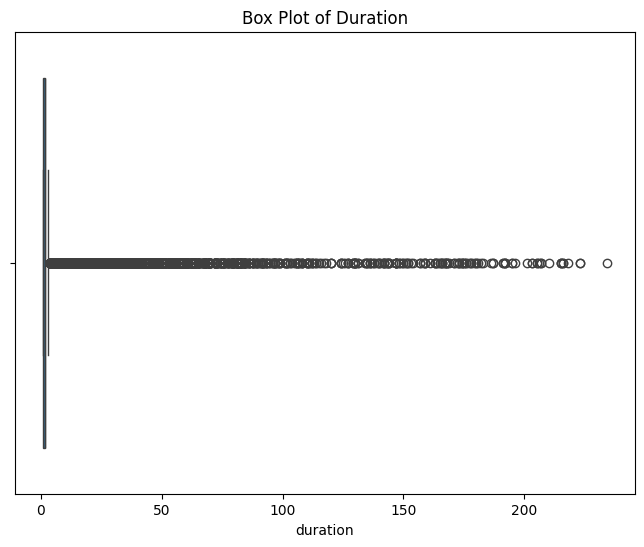

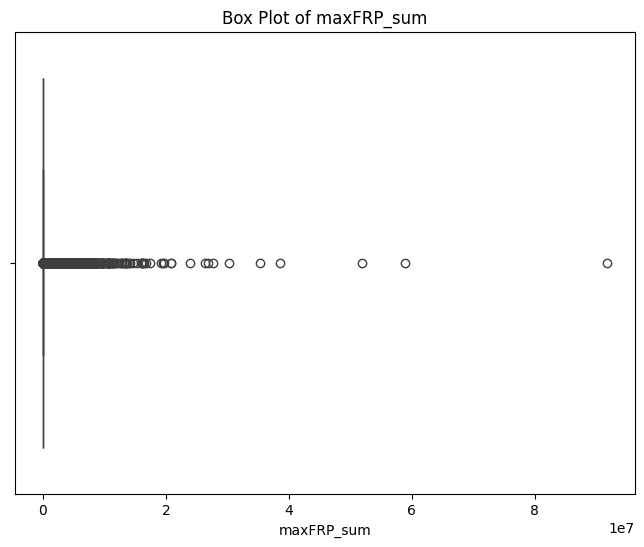

In [ ]:
#box plot for 'duration'
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['duration'])
plt.title('Box Plot of Duration')
plt.show()

#box plot for 'maxFRP_sum'
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['maxFRP_sum'])
plt.title('Box Plot of maxFRP_sum')
plt.show()

The box plots show that despite these maximum values being high, it is not unusual for there to be outliers in either of these two columns. These outliers are likely not errors in the data.

<Axes: xlabel='area', ylabel='Count'>

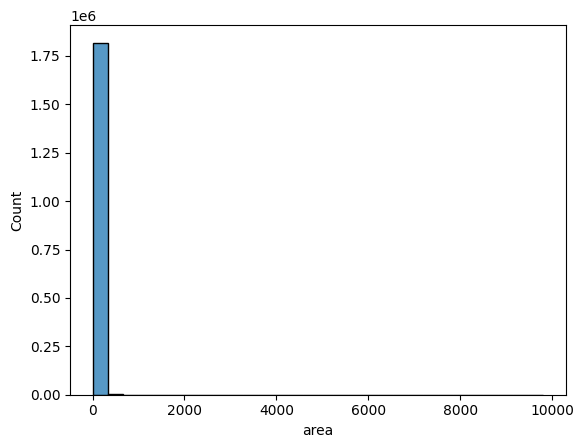

In [ ]:
#area histogram
sns.histplot(df['area'], bins=30) # most fires are small, highly right skewed

<Axes: xlabel='area'>

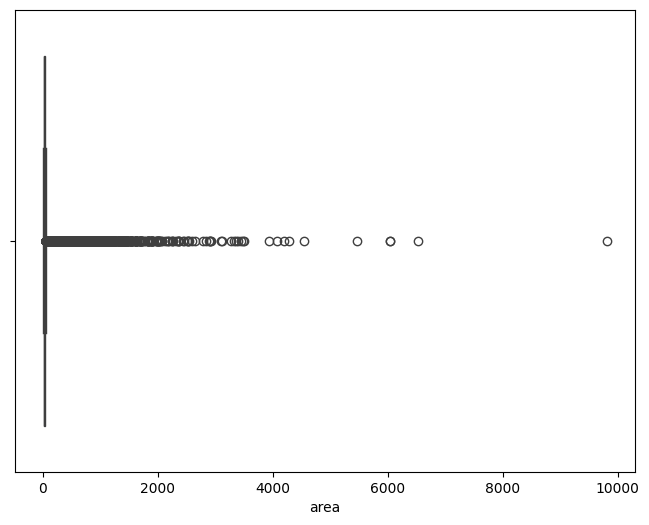

In [ ]:
#area box plot
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['area'])

In [ ]:
#How much of the data are outliers?
Q1 = df['area'].quantile(0.25)
Q3 = df['area'].quantile(0.75)
IQR = Q3 - Q1

upper_whisker = Q3 + 1.5 * IQR

In [ ]:
print(upper_whisker) #anything above 47 km^2 is an outlier

47.22490812463049


In [ ]:
upper_outliers = df[df['area'] > upper_whisker]

In [ ]:
len(upper_outliers) #the amount of fires that are outliers

135175

In [ ]:
#proportion of fires that are outliers
prop_outliers = len(upper_outliers) / len(df)
print(f"Proportion of upper outliers: {prop_outliers:.2%}")

Proportion of upper outliers: 7.42%


Text(0.5, 1.0, 'Log-Transformed Burned Area Distribution')

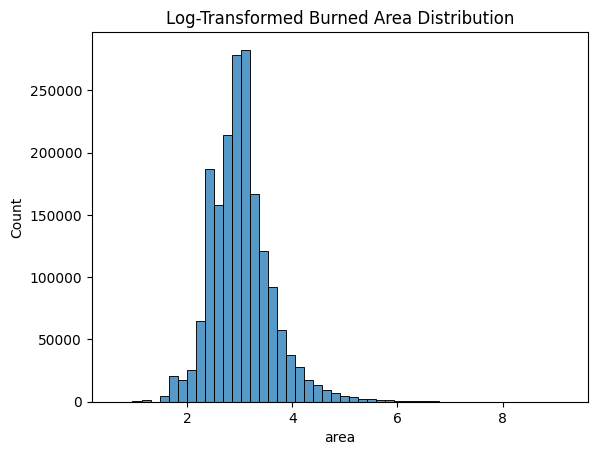

In [ ]:
#log transform area for visualization purposes
sns.histplot(np.log1p(df['area']), bins=50)
plt.title('Log-Transformed Burned Area Distribution')

In [ ]:
df['area'].describe(percentiles=[0.5, 0.9, 0.95, 0.99])

,area
count,1.821713e+06
mean,2.487912e+01
std,3.891786e+01
min,8.586347e-01
50%,1.888996e+01
90%,4.035583e+01
95%,5.666989e+01
99%,1.322297e+02
max,9.808184e+03


Area is in km^2 / 1.8 million fire events
- average fire is ~25km^2
- half of fires burned are less than 19km^2
- only 1% of fires were bigger than 132km^2
- the biggest fire was almost 10,000 km^2

Insights:
- Most fires are small/moderate (0.8–100 km²)
- A few massive fires dominate the upper range (right skew)

In [ ]:
#creating a log_area column
df['log_area'] = np.log1p(df['area'])

<Axes: xlabel='maxFRP_sum', ylabel='Count'>

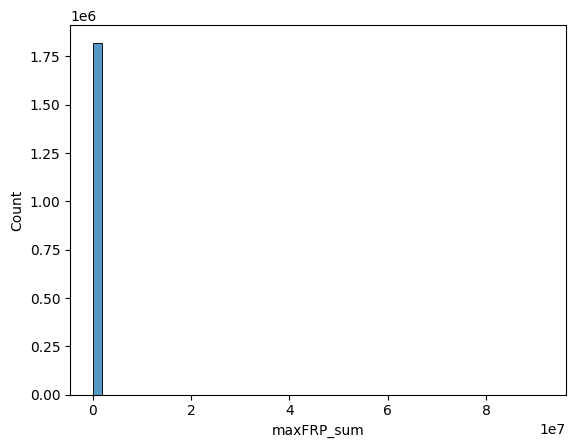

In [ ]:
sns.histplot(df['maxFRP_sum'], bins=50) #also very right skewed

In [ ]:
#creating logFRP from maxFRP_sum for visualization purposes
df['log_FRP'] = np.log1p(df['maxFRP_sum'])

<Axes: xlabel='log_FRP', ylabel='Count'>

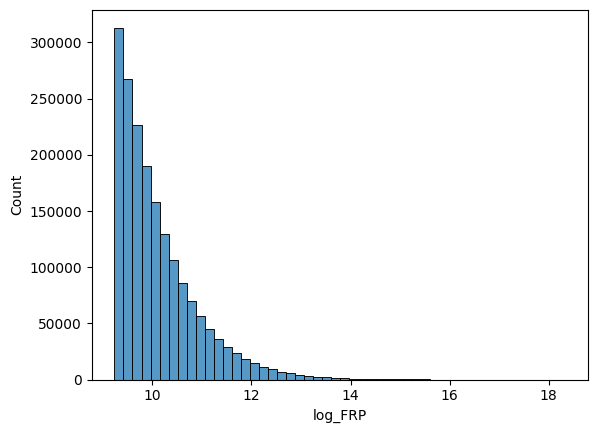

In [ ]:
#log_FRP histogram
sns.histplot(df['log_FRP'], bins=50)

In [ ]:
df['maxFRP_sum'].describe(percentiles=[0.5, 0.9, 0.95, 0.99])

,maxFRP_sum
count,1.821713e+06
mean,4.293948e+04
std,1.844643e+05
min,1.027600e+04
50%,1.950800e+04
90%,7.270180e+04
95%,1.229620e+05
99%,3.816516e+05
max,9.170085e+07


- FRP ranges from 10,276 - 91,700,850
- most fires have low power, and fewer fires have high power (corresponds with trends with area, so larger the area, the larger the FRP)

#### How Do Environmental Variables Influence Fire Severity?

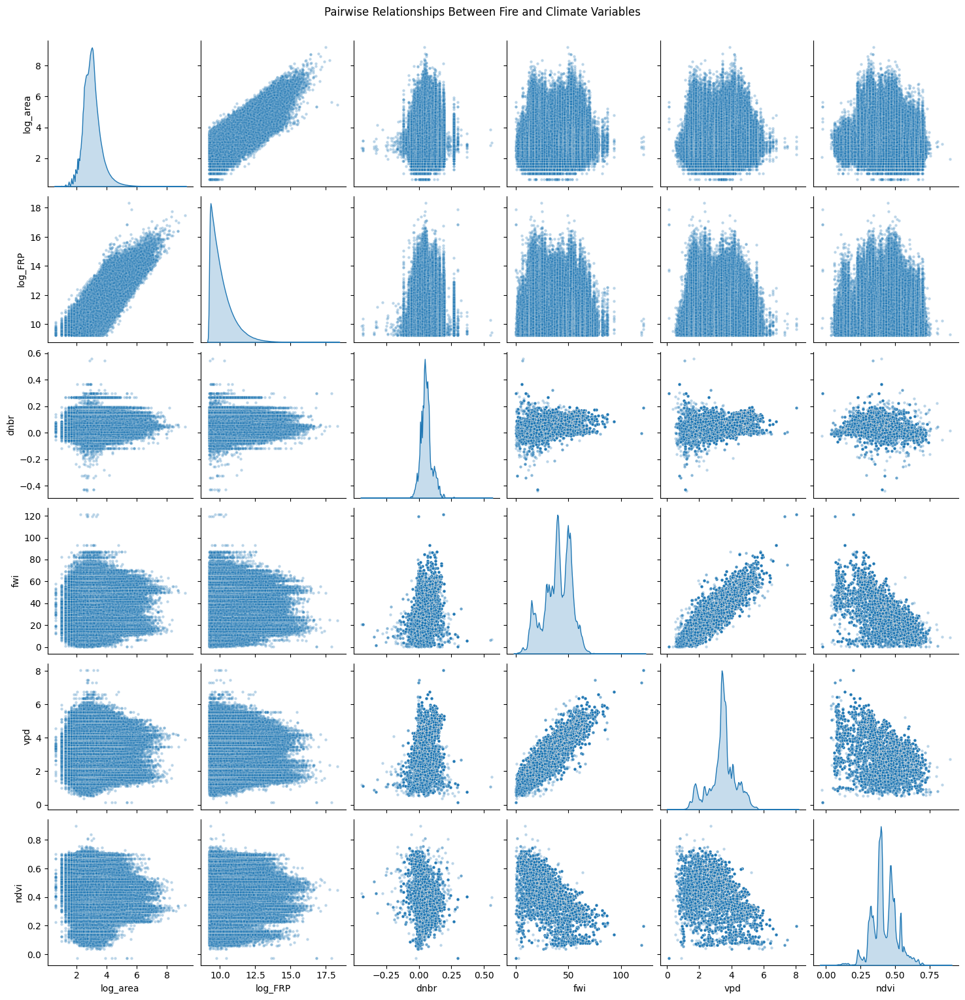

In [ ]:
sns.pairplot(
    df,
    vars=['log_area', 'log_FRP', 'dnbr', 'fwi', 'vpd', 'ndvi'],
    diag_kind='kde',
    plot_kws={'alpha': 0.3, 's': 10}
)
plt.suptitle('Pairwise Relationships Between Fire and Climate Variables', y=1.02)
plt.show()

- No discernable relationship between the climate variables and the target variable (area), a concern for model performance
- Strong positive correlation between log_area and log_frp
- fire weather index (fwi) and vapor pressure deficit (vpd) have a strong postive correlation as well
- fwi and normalized difference vegetation index (ndvi) have a negative correlation. Drier/hotter weather is associated with less dense or dry vegetation
- similar relationship between vpd and ndvi which makes sense because vpd and fwi are positively correlated
- dnbr shows minimal positive correlation with fwi and vpd, suggesting that more severe burns (higher dnbr) are associated with conditions conducive to fire. It has a negative correlation with ndvi, which also makes sense- more severe burns occur where there is less healthy vegetation

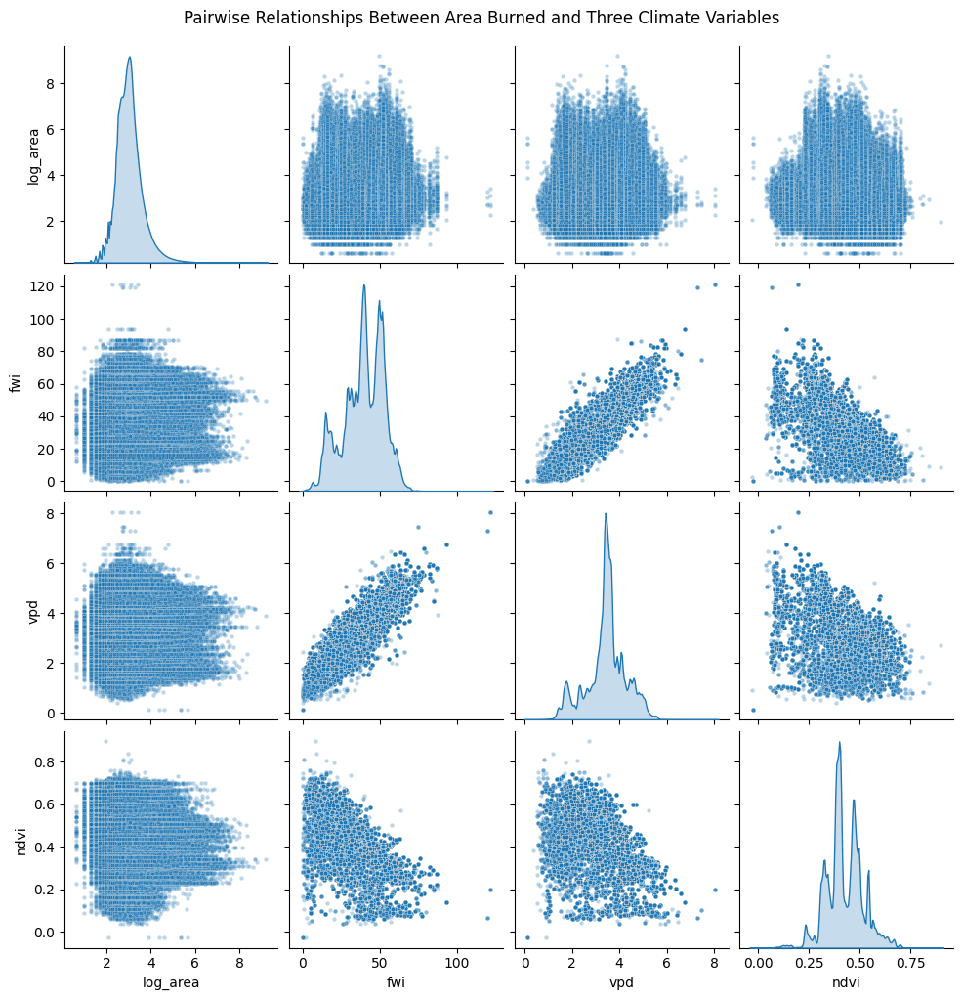

In [ ]:
#pair plot with less variables for presentation purposes
sns.pairplot(
    df,
    vars=['log_area', 'fwi', 'vpd', 'ndvi'],
    diag_kind='kde',
    plot_kws={'alpha': 0.3, 's': 10}
)
plt.suptitle('Pairwise Relationships Between Area Burned and Three Climate Variables', y=1.02)
plt.show()

<Axes: >

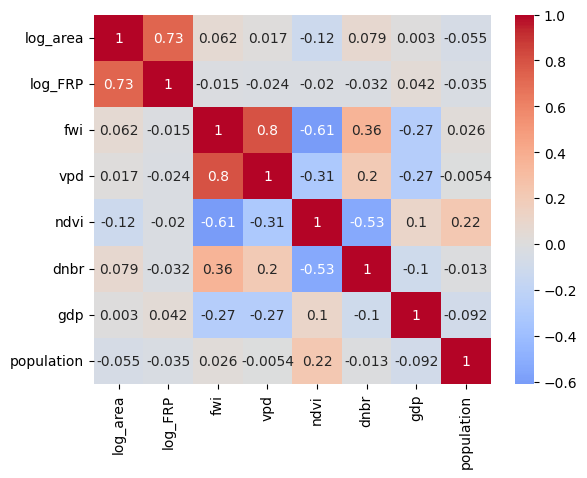

In [ ]:
#checking correlation figures
numeric_cols = ['log_area', 'log_FRP', 'fwi', 'vpd', 'ndvi', 'dnbr', 'gdp', 'population']
corr = df[numeric_cols].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', center=0)


- Trends as described in the pairplot above are reinforced by these numbers
- gdp and population show very weak linear correlations with most of the fire and environmental variables. This suggests that, based on linear relationships alone, socioeconomic factors as represented by these columns might not be strong predictors of the physical aspects of fire severity (area or FRP), although they could be related to the impact of fires or other factors not captured here. I will remove gdp and population from the dataset, as I don't believe they will provide any strong predictive power in the model.

In [ ]:
#removing gdp and population from the dataset (see note above)
df = df.drop(columns=['gdp', 'population'])

<Axes: >

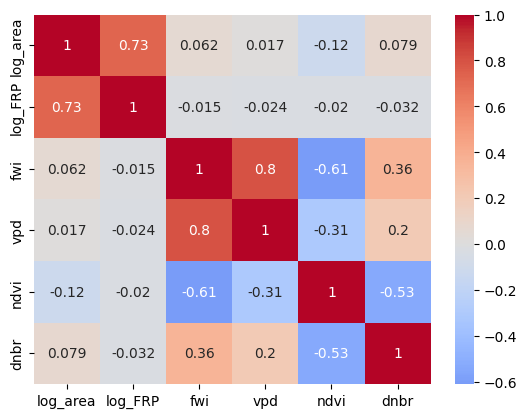

In [ ]:
#cleaner corr plot without gdp & population for presentation purposes
numeric_cols_ = ['log_area', 'log_FRP', 'fwi', 'vpd', 'ndvi', 'dnbr']
corr = df[numeric_cols_].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', center=0)

#### What Makes a Severe Fire?

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


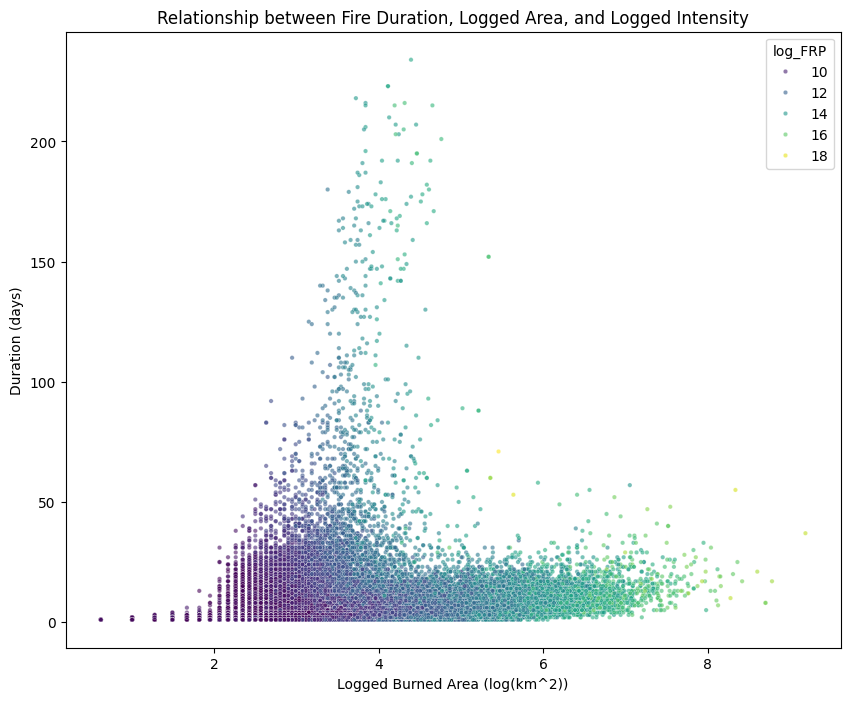

In [ ]:
#scatter plot with log_area on the x-axis, duration on the y-axis, and log_FRP as hue
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x='log_area', y='duration', hue='log_FRP', palette='viridis', alpha=0.6, s=10)
plt.title('Relationship between Fire Duration, Logged Area, and Logged Intensity')
plt.xlabel('Logged Burned Area (log(km^2))')
plt.ylabel('Duration (days)')
plt.show()

- Fires that last a short time can still burn a significant amount of area
- However, they do tend to do more damage the longer they last
- The majority of fires do not last more than 50 days
- Fire intensity (frp) increases with area burned predominantly but also with duration to a lesser extent
- The most intense fires are frequently the biggest, but there is also a secondary trend where intensity increases with duration more than size (contained fires?)

#### Have Fires Become More Severe Over Time?

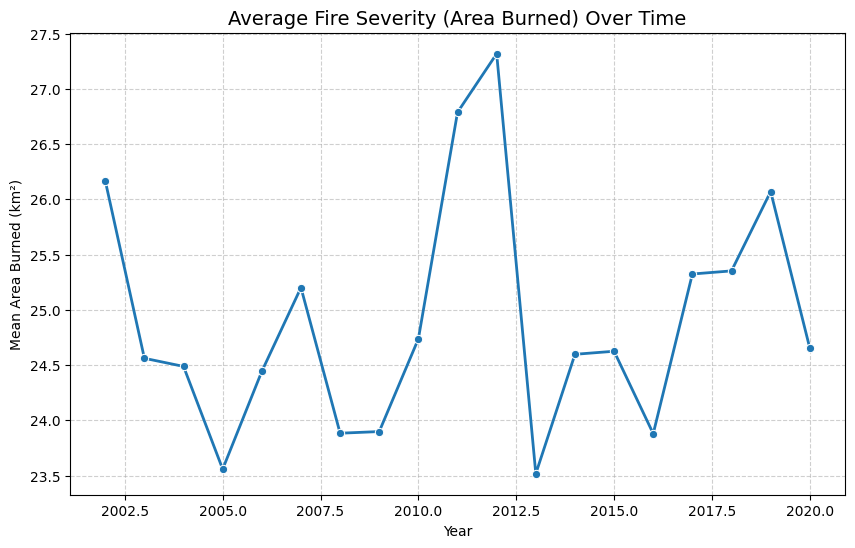

In [ ]:
#group df by year and calculate mean burned area
severity_by_year = df.groupby('year', as_index=False)['area'].mean()

plt.figure(figsize=(10,6))
sns.lineplot(data=severity_by_year, x='year', y='area', marker='o', linewidth=2)
plt.title('Average Fire Severity (Area Burned) Over Time', fontsize=14)
plt.xlabel('Year')
plt.ylabel('Mean Area Burned (km²)')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

- No evidence showing that fires have steadily increased over the last 19 years, but this is probably too short of a timeline to see trends like that
- 2011 we saw an increase is the global avg fire size
- 2012 had a decrease (interesting following the peak in 2011)
- The global average size of fires in my dataset remains between 27.5-23.5. Smaller fires are significantly more common than large ones

#### Where are the Largest Fires?

In [ ]:
#sort df by area
df_area = df.sort_values(by='area', ascending=False)
df_area.head()

,duration,maxFRP_sum,area,country,continent,dtime_min,lat_mean,lon_mean,year,month,fwi,vpd,ndvi,dnbr,log_area,log_FRP
82558,37,38495482,9808.184100,australia,Oceania,2003-01-08,-36.548620,147.786409,2003,1,49.277260,3.902298,0.342734,0.043714,9.191074,17.466051
989250,17,23872016,6530.775476,australia,Oceania,2011-09-07,-18.575456,132.637620,2011,9,50.176450,3.464824,0.326918,0.047089,8.784434,16.988217
1737529,8,13515940,6034.484624,australia,Oceania,2019-12-29,-37.421710,148.861584,2019,12,51.953552,4.156886,0.340802,0.058607,8.705411,16.419380
1737528,8,13515940,6034.484624,australia,Oceania,2019-12-29,-37.421710,148.861584,2019,12,51.953552,4.156886,0.340802,0.058607,8.705411,16.419380
508227,21,26771777,5459.199379,australia,Oceania,2006-12-01,-37.240686,146.654553,2006,12,55.564518,4.221583,0.303525,0.058213,8.605241,17.102859


In [ ]:
#list of colors to color code by year
color_list = [
    "#fff7bc",
    "#ffe391",
    "#ffcf66",
    "#ffba3a",
    "#ffa500",
    "#ff9400",
    "#ff8300",
    "#ff7200",
    "#ff6100",
    "#ff4f00",
    "#ff3d00",
    "#ff2a00",
    "#ff1700",
    "#f40000",
    "#df0000",
    "#c80000",
    "#b00000",
    "#8a0000",
    "#660000"]

In [ ]:
#create a folium map of the largest fires (consists of outlier fires)
def generateBaseMap(default_location=[0, 0], default_zoom_start=2):
    '''
    Create a base map
    '''
    base_map = folium.Map(
        location = default_location
        , control_scale = True
        , zoom_start = default_zoom_start
    )

    for _, row in df_area.head(10000).iterrows():
        folium.Circle(
            location=[row['lat_mean'], row['lon_mean']], radius= 50 * row['area'],
            color= color_list[row['year']-2002],
            fill=True,
            fill_opacity=0.6,
            #tooltip
            tooltip=f"Year: {row['year']} | Area: {row['area']:.1f}"
        ).add_to(base_map)

    return base_map

In [ ]:
generateBaseMap()

In [ ]:
#count fires and average area per country
country_summary = (
    df.groupby('country')
      .agg(
          fire_count=('area', 'count'),
          avg_area=('area', 'mean')
      )
      .reset_index()
)

#sort by most frequent fires
top10_countries = country_summary.sort_values('fire_count', ascending=False).head(10)

top10_countries


,country,fire_count,avg_area
20,brazil,208657,22.085290
3,angola,191274,22.032208
39,democratic republic of the congo,181294,21.107971
6,australia,119910,43.350769
147,south sudan,103224,27.740470
134,russia,90396,33.854292
179,zambia,74243,22.699249
29,central african republic,56976,28.289539
105,mozambique,52541,21.722538
172,united states of america,39188,27.362375


- Australia had the top 5 largest fires, but when aggregated by area and amount of fires, Brazil is the top spot
- Africa is the continent with the most fires
- South Sudan has some of the most fires despite only became as country in 2011 (most of S. Sudan's weather data had to be imputed)

## Feature Engineering

The environmental variables currently show limited predictive strength individually. I will engineer new features to enhance the model’s explanatory capacity and create a target variable based on the area column to represent fire severity.

In [ ]:
# define lat/lon bins
df['lat_bin'] = (df['lat_mean'] // 2).astype(int)   # 2° grid
df['lon_bin'] = (df['lon_mean'] // 2).astype(int)

# sort within each country-region by date
df = df.sort_values(['country', 'lat_bin', 'lon_bin', 'dtime_min'])

# compute time since last fire (in months)
df['months_since_last_fire'] = df.groupby(
    ['country', 'lat_bin', 'lon_bin']
)['dtime_min'].diff().dt.days / 30.4

# fill NaNs (first fires in each region) with the mean for that country
df['months_since_last_fire'] = df.groupby('country')['months_since_last_fire'].transform(
    lambda x: x.fillna(x.mean()))



Feature: Months Since Last Fire

This feature measures how much time (in months) has passed since the previous fire occurred in the same local region of the same country.

To create it, I:

1. Divided the world into small 2°×2° latitude–longitude grid cells, which represent local areas. This gives a more granular view of fire patterns that the dataset doesn't currently provide.

2. Grouped the data by country and grid cell so that fires are only compared within the same area and country.

3. Used the fire date (dtime_min) to calculate the time difference between fires in each group.

4. Converted the difference from days to months.

5. Filled the first fire in each region (which has no previous fire) with the average months since last fire for that country.

This results in a feature that captures how recently an area last burned, which can be important for predicting fire severity — areas that haven’t burned for a long time may have more fuel built up and could experience more severe fires.

In [ ]:
#NaNs in near feature, 5 total
df[df['months_since_last_fire'].isna()]


,duration,maxFRP_sum,area,country,continent,dtime_min,lat_mean,lon_mean,year,month,fwi,vpd,ndvi,dnbr,log_area,log_FRP,lat_bin,lon_bin,months_since_last_fire
1002209,1,15632,6.869078,baikonur,Asia,2011-10-05,46.108333,63.152346,2011,10,18.057823,0.662226,0.1005,-0.0412,2.062941,9.657139,23,31,NaN
836007,2,23570,21.465867,barbados,North America,2010-03-04,13.167308,-59.585799,2010,3,28.927193,0.978537,0.2645,-0.0128,3.111997,10.067772,6,-30,NaN
62422,2,21570,13.738155,french polynesia,Oceania,2002-10-31,-17.616667,-149.582011,2002,10,10.823603,1.259016,0.5856,0.0986,2.690440,9.979105,-9,-75,NaN
1776348,1,14581,12.020886,somaliland,Africa,2020-07-12,10.397024,44.252179,2020,7,32.427055,3.257829,0.1105,0.0508,2.566555,9.587543,5,22,NaN
1716306,1,12770,12.879520,são tomé and príncipe,Africa,2019-09-12,0.370278,6.684862,2019,9,7.944300,0.592520,0.7492,-0.1617,2.630414,9.454932,0,3,NaN


In [ ]:
#drop 5 columns with NaNs
df = df[df['months_since_last_fire'].notna()]

There were 5 records with missing values in the months_since_last_fire feature, all corresponding to small island or low-fire regions with only a single recorded fire (e.g., Barbados, French Polynesia, São Tomé and Príncipe).
These were removed from the dataset, as they do not provide meaningful information about fire recurrence and represent an extremely small proportion of the data (<0.001%).

In [ ]:
# season progress adjusted for hemisphere
# shift months by 6 for fires in the Southern Hemisphere so that fire seasons align
df['adjusted_month'] = df['month']
df.loc[df['lat_mean'] < 0, 'adjusted_month'] = ((df.loc[df['lat_mean'] < 0, 'month'] + 6 - 1) % 12) + 1

# compute season progress as a fraction of the adjusted year
df['season_progress'] = df['adjusted_month'] / 12


(# close to 0, early in the year / # close to 1 late in the year)

Feature: Season Progress

This feature represents how far through the year each fire occurred. It helps the model capture seasonal timing. For example, fires later in the dry season might behave differently from early-season fires. This feature has also been normalized by hemisphere.

In [ ]:
#combines NDVI (vegetation health) and VPD (dryness) to represent vegetation stress
df['veg_stress'] = df['vpd'] * (1 - df['ndvi'])


Feature: Veg Stress

This feature combines vegetation health (ndvi) with atmospheric dryness (vpd). It captures how stressed or flammable vegetation might be. High VPD (dry air) and low NDVI (dry vegetation) indicate high stress and likely higher fire risk.

In [ ]:
#counts the number of fires in each country per year
df['fires_per_year_country'] = df.groupby(['country', 'year'])['area'].transform('count')

Feature: Fires per Year by Country

This feature shows how many fires occurred in the same country and year. It provides context about local fire frequency, helping the model recognize regions or years with higher baseline fire activity.

## Prepare Data for Modeling

Now that data cleaning, analysis, and feature engineering are complete, the dataset will be prepared for modeling. This process involves finalizing the target variable (y) and removing any non-predictive columns to define the feature set (X). The resulting dataframe will then be saved as a CSV file for use in a separate modeling notebook.

In [ ]:
#creating the target variable (y)
conditions = [
    df['area'] <= 20,
    (df['area'] > 20) & (df['area'] < 50),
    df['area'] >= 50
]

# numerical encoding: 0 = small, 1 = medium, 2 = big
choices = [0, 1, 2]

df['severity'] = np.select(conditions, choices)

Target was based off of the distribution of fires in the dataset.

In [ ]:
#checking class distribution
df['severity'].value_counts(normalize=True)

,proportion
severity,
0,0.569564
1,0.366286
2,0.064150


Moderately imbalanced class distribution

In [ ]:
#create predictive feature set
df = df.drop(columns = ['duration', 'maxFRP_sum', 'area', 'country', 'continent', 'dtime_min', 'year', 'month', 'dnbr', 'log_area', 'log_FRP', 'adjusted_month', 'lat_bin', 'lon_bin'])

In [ ]:
#final dataset for modeling
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1821708 entries, 423135 to 1812519
Data columns (total 10 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   lat_mean                float64
 1   lon_mean                float64
 2   fwi                     float64
 3   vpd                     float64
 4   ndvi                    float64
 5   months_since_last_fire  float64
 6   season_progress         float64
 7   veg_stress              float64
 8   fires_per_year_country  int64  
 9   severity                int64  
dtypes: float64(8), int64(2)
memory usage: 152.9 MB


In [ ]:
#save cleaned data as csv
#df.to_csv('/content/drive/MyDrive/cleaned_fire_data.csv', index=False)